# Detecting a rotated chest X-ray (CXR) image is crucial for proper medical analysis and automated diagnostics. There are several techniques that can be used to identify and correct rotated X-ray images:
1. Deep Learning-Based Approaches

✅ Best for large datasets & high accuracy

    Convolutional Neural Networks (CNNs):
        Train a CNN to classify images as "rotated" or "correctly oriented."
        Example architectures: ResNet, VGG, EfficientNet.
    Autoencoders / Self-Supervised Learning:
        An autoencoder can learn normal orientations and identify when an image is misaligned.
        Contrastive learning (e.g., SimCLR, MoCo) can learn representations and detect rotation.

🔹 Example:

    Train a CNN classifier on CXR images labeled with different rotation angles (e.g., 0°, 90°, 180°, 270°).
    The model predicts whether an image is rotated and suggests corrections.

2. Classical Computer Vision Techniques

✅ Good for small datasets & fast processing
A. Edge Detection & Keypoint Detection

    Hough Line Transform:
        Detects vertical and horizontal structures in X-rays.
        If the lung boundaries or clavicles are tilted, the image is likely rotated.
    Harris Corner Detector / SIFT / ORB Features:
        Extract keypoints (e.g., rib cage edges) and compare them with known orientations.

B. Symmetry-Based Methods

    Lungs and spine are normally symmetrical in frontal CXR.
    Use symmetry detection:
        Histogram of oriented gradients (HOG)
        Radon transform (detects dominant line orientations)
        Fourier transform-based alignment (checks for dominant vertical structures)

C. PCA (Principal Component Analysis)

    Compute the principal axis of the lung region.
    If the major axis is significantly tilted, the image is rotated.

3. Template Matching

✅ Useful when reference images are available

    Compare an input X-ray with a set of correctly aligned reference images.
    Use cross-correlation or structural similarity index (SSIM) to measure alignment.
    If misalignment is detected, rotate the image until it best matches the reference.

4. Statistical Methods

    Compute the intensity profile along the vertical axis:
        Normally, pixel intensity distribution should be symmetrical.
        If the distribution is skewed, the image might be rotated.
    Gradient orientation histograms:
        In a correctly oriented image, most gradients should be vertical.
        Rotation causes shifts in the gradient histogram.

Which Method to Use?
<table data-start="2634" data-end="3127"><thead data-start="2634" data-end="2673"><tr data-start="2634" data-end="2673"><th data-start="2634" data-end="2650"><strong data-start="2636" data-end="2649">Technique</strong></th><th data-start="2650" data-end="2661"><strong data-start="2652" data-end="2660">Pros</strong></th><th data-start="2661" data-end="2673"><strong data-start="2663" data-end="2671">Cons</strong></th></tr></thead><tbody data-start="2711" data-end="3127"><tr data-start="2711" data-end="2797"><td>CNN-based detection</td><td>High accuracy, generalizable</td><td>Needs labeled data &amp; training</td></tr><tr data-start="2798" data-end="2883"><td>Hough Line Transform</td><td>Fast, detects rotations well</td><td>Struggles with noisy images</td></tr><tr data-start="2884" data-end="2969"><td>PCA-based</td><td>No training needed, works on symmetry</td><td>Fails if lungs are asymmetric</td></tr><tr data-start="2970" data-end="3057"><td>Radon Transform</td><td>Effective for detecting skewed images</td><td>Computationally expensive</td></tr><tr data-start="3058" data-end="3127"><td>Template Matching</td><td>Easy to implement</td><td>Requires reference images</td></tr></tbody></table>

# ===============================================
# CNN-based detection with downscaled xray images
# ===============================================

* ## Downscaling the image
Best Interpolation for Downscaling X-ray Images

For medical images, preserving details is crucial. The best interpolation method is:

✅ cv2.INTER_AREA → Best for downscaling (avoids aliasing & preserves details).

This method averages pixel values, making it ideal for medical imaging where preserving structures is critical.

In [36]:
%load_ext autoreload
%autoreload 2

# ensure the notebook reloads the updated .py modules when importing them

In [17]:
from src.utils.img_processing import ImageProcessor, Test
import cv2
import matplotlib.pyplot as plt

## Prepare dowscaled data to train the CNN model to determine the image orientaion
1. Downscaling of the original images
2. removing duplicates
3. Creating test and traning data

In [5]:
# 1. Dowsncaling
from src.utils.img_processing import ImageProcessor
from src.defs import IMAGE_DIRECTORIES as imdir, DiseaseCategory as dc

ip = ImageProcessor()

new_size = (75, 75)

for disease in dc:
    inFolder = fr"C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\{disease.value}\images"
    outFolder = fr"C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\{disease.value}\downscaled"
    ip.downscaleToFolder(inputFolder=inFolder, outputFolder=outFolder, new_size=new_size)


1345 images have been downscaled and stored to C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\Viral Pneumonia\downscaled\75x75
3616 images have been downscaled and stored to C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\COVID\downscaled\75x75
6012 images have been downscaled and stored to C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\Lung_Opacity\downscaled\75x75
10192 images have been downscaled and stored to C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\Normal\downscaled\75x75


In [ ]:
# 2. removing duplicates

# remove duplicated images for each category in downscaled folders
import os, pandas as pd
from src.defs import DiseaseCategory as dc

# prepare a list having images to be removed
df_duplicates_only = pd.read_csv(r"C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\3_image_duplicates_only.csv")
df_duplicates_to_remove = df_duplicates_only[df_duplicates_only['mean intensity'].duplicated(keep='first')]
duplicated_images_to_remove = df_duplicates_to_remove["file name"] + '.png'
duplicated_images_to_remove = duplicated_images_to_remove.to_list()

# removing duplicated images from the dataset

img_removed = []	# List to store removed images

for cat in dc:
    #set the base directory
    img_dir = fr"C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\{cat.value}\downscaled\75x75"
    
    # Iterate through all images in the directory
    all_images = [img for img in os.listdir(img_dir) if img.endswith('.png')]

    # Remove matching files
    for filename in duplicated_images_to_remove:
        file_path = os.path.join(img_dir, "75x75_"+filename)
        if os.path.exists(file_path):
            os.remove(file_path)
            img_removed.append(filename)

print("duplicates to remove:", len(duplicated_images_to_remove), duplicated_images_to_remove)
print("removed duplicates:", len(img_removed), img_removed)

In [ ]:
# 3. Creating test and traning data

# manual selection (visual control) of vertically oriented images to
# C:\Users\User\DataScience\area51\data_75x75\data_image_rotation\75x75_rotated_0

import os
import cv2

# rotate images from the sourceFolder by +90/-90/180° and store to targetFolder

sourceFolder = r"C:\Users\User\DataScience\area51\data_75x75\data_image_rotation\75x75_rotated_0" # manually selected images

targetFolders = (r"C:\Users\User\DataScience\area51\data_75x75\data_image_rotation\75x75_rotated_+90",
                 r"C:\Users\User\DataScience\area51\data_75x75\data_image_rotation\75x75_rotated_-90",
                 r"C:\Users\User\DataScience\area51\data_75x75\data_image_rotation\75x75_rotated_180")


# List all files from sourceFolder
all_images = [img for img in os.listdir(sourceFolder) if img.lower().endswith((".png"))]

# rotate
for targetFolder, angle in zip(targetFolders, (90, -90, 180)):
    if not os.path.exists(targetFolder):
        os.makedirs(targetFolder)
    # Rotate and save images
    for image_name in all_images:
        img_path = os.path.join(sourceFolder, image_name)
        image = cv2.imread(img_path)

        # Rotate image
        if angle == 90:
            rotated_img = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
        elif angle == -90:
            rotated_img = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
        elif angle == 180:
            rotated_img = cv2.rotate(image, cv2.ROTATE_180)  # or cv2.flip(image, -1)
        else:
            pass

        # Save rotated image to target folder
        target_path = os.path.join(targetFolder, f"rotated_{angle}_{image_name}")
        cv2.imwrite(target_path, rotated_img)



# CNN Orientation Classification using ResNet
* create-->fit-->validate-->save results

In [1]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import os
import json


In [ ]:

"""
1. Real-time Data Loading:

    * Reads images directly from folders in batches.
    * Useful when datasets don't fit entirely into memory.
    * --> Automatically assigns labels based on folder structure.
    
dataset/
├── 75x75_rotated_0/
│   ├── image1.png
│   ├── image2.png
│   └── ...
└── 75x75_rotated_90/
    ├── image101.png
    ├── image102.png
    └── ...
"""


# Define parameters
img_height, img_width = 75, 75
batch_size = 32
epochs = 20

# Data paths
train_data_dir = r"C:\Users\User\DataScience\area51\data_75x75\data_image_rotation"  # Path to your dataset folder

# parameter for image data generator for real-time data loading
dataGenParams = {
    "dataGen_1": {
        "rescale": 1./255,
        "validation_split": 0.2,
    },
    "dataGen_2": {
        "rescale": 1./255,
        "validation_split": 0.2,
        "rotation_range": 5, # +/-5°
        "width_shift_range": 0.1,  # +/-10%
        "height_shift_range": 0.1 # +/-10%
    }
}


# two augmentation strategies
for dg in dataGenParams:
    
    resnet_1_model_dir = fr"C:\Users\User\DataScience\area51\models\resnet\resnet_1\{dg}"

    if not os.path.exists(resnet_1_model_dir):
        os.makedirs(resnet_1_model_dir)

    # Data preparation --> Automatically assigns labels based on folder structure
    train_datagen = ImageDataGenerator(**dataGenParams[dg])

    train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_height, img_width),
        color_mode='grayscale',
        batch_size=batch_size,
        class_mode='categorical',
        subset='training'
    )

    validation_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_height, img_width),
        color_mode='grayscale',
        batch_size=batch_size,
        class_mode='categorical',
        subset='validation'
    )

    # Build ResNet Model
    base_model = ResNet50(weights=None, include_top=False, input_tensor=Input(shape=(img_height, img_width, 1)))

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dense(4, activation='softmax')  # 4 labels: 0, +90, -90, 180
    ])

    model.compile(optimizer=Adam(learning_rate=0.0001),
                loss='categorical_crossentropy',
                metrics=['accuracy'])


    # --use this callbacks to stop at certain val_accuracy--------------------------------------------

    # from tensorflow.keras.callbacks import EarlyStopping

    # #----defining train-stop-callback with the target val_acccuracy
    # early_stop = EarlyStopping(
    #     monitor='val_accuracy',  # monitor validation accuracy
    #     patience=2,              # wait for 5 epochs to confirm no improvement (optional)
    #     verbose=1,
    #     mode='max',              # higher val_accuracy is better
    #     restore_best_weights=True
    # )

    class StopAtValAccuracy(tf.keras.callbacks.Callback):
        def __init__(self, target_val_accuracy=0.95):
            super().__init__()
            self.target_val_accuracy = target_val_accuracy

        def on_epoch_end(self, epoch, logs=None):
            val_accuracy = logs.get("val_accuracy")
            if val_accuracy is not None:
                if val_accuracy >= self.target_val_accuracy:
                    print(f"\nReached target validation accuracy of {self.target_val_accuracy*100:.2f}% at epoch {epoch+1}. Stopping training.")
                    self.model.stop_training = True

    # stop when val_accuracy reaches 
    target_val_acc = 0.98

    #---------Train model----------------
    # train order is given by folder oder in train_data_dir:
    #  '75x75_rotated_+90': 0,
    #  '75x75_rotated_-90': 1,
    #  '75x75_rotated_0': 2,
    #  '75x75_rotated_180': 3

    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=validation_generator,
        callbacks=[StopAtValAccuracy(target_val_accuracy=target_val_acc)]  # early_stop
    )

    # Evaluate on validation data
    val_loss, val_accuracy = model.evaluate(validation_generator)
    print(f'Validation accuracy: {val_accuracy:.2%}')

    #-----storing reslts to files: model, dataGenParams, training history, evaluation results------------------------------------------------------------

    import os
    import json

    # Save the model
    model_path = os.path.join(resnet_1_model_dir, f'orientation_classifier_resnet_1_{dg}.keras')
    model.save(model_path)

    # save dataGenParams used
    dataGenParams_path = os.path.join(resnet_1_model_dir, f'dataGenParams_{dg}.json')
    with open(dataGenParams_path, 'w') as f:
        json.dump(dataGenParams[dg], f)

    # Save training history
    history_path = os.path.join(resnet_1_model_dir, f'training_history_resnet_1_{dg}.json')
    with open(history_path, 'w') as f:
        json.dump(history.history, f)

    # Save evaluation results
    evaluation_results = {
        "val_loss": val_loss,
        "val_accuracy": val_accuracy
    }

    evaluation_path = os.path.join(resnet_1_model_dir, f'evaluation_results_resnet_1_{dg}.json')
    with open(evaluation_path, 'w') as f:
        json.dump(evaluation_results, f, indent=4)




# Loading saved model, dataGenParams, training history, evaluation results
* show model parameters and accuracy

In [2]:
#------loading saved model, dataGenParams, training history, evaluation results
import json, os
from tensorflow.keras.models import load_model

# ----!!!!!----->Load model with correpsonding dataGenParams<-----!!!!!----
# model_with_dataGenParams = "dataGen_1"
selected_dataGenParams = "dataGen_2"

resnet_1_model_dir = fr"C:\Users\User\DataScience\area51\models\resnet\resnet_1\{selected_dataGenParams}"

# loading model
model_path = os.path.join(resnet_1_model_dir, f'orientation_classifier_resnet_1_{selected_dataGenParams}.keras')
model = tf.keras.models.load_model(model_path)

# Load training history
history_path = os.path.join(resnet_1_model_dir, f'training_history_resnet_1_{selected_dataGenParams}.json')
with open(history_path, 'r') as f:
    history = json.load(f)


# Load saved evaluation results
evaluation_path = os.path.join(resnet_1_model_dir, f'evaluation_results_resnet_1_{selected_dataGenParams}.json')
with open(evaluation_path, 'r') as f:
    evaluation_results = json.load(f)

#----model summary
print("Evaluation metrics: ",evaluation_results)
model.summary()

# Plot accuracy and loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history['accuracy'], label='Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history['loss'], label='Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss')

plt.show()




FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\User\\DataScience\\area51\\models\\resnet\\resnet_1\\dataGen_2\\evaluation_results_resnet_1_dataGen_2.json'

## Predict image orientation
    Step 1: Load the trained model
    Step 2: Define the prediction function
    Step 3: Estimate orientation for images

In [ ]:
import pandas as pd
import numpy as np
import os, cv2
from src.defs import DiseaseCategory as dc
from tensorflow.keras.models import load_model

# Step 2: Define the prediction function

def predict_orientation(img_path, model):
    # Load the image in grayscale
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    
    # Resize to match model input
    img_resized = cv2.resize(img, (75, 75))
    img_resized = img_resized / 255.0  # Normalize pixel values
    
    # Expand dimensions to match model input shape (1, 75, 75, 1)
    img_input = np.expand_dims(img_resized, axis=[0, -1])

    # Get predictions
    prediction = model.predict(img_input)  # Shape: (1, 4)

    # Class index mapping from train_generator.class_indices
    index_to_orientation = {
        0: 'rotated_90',       # from folder 75x75_rotated_+90
        1: 'rotated_minus_90', # from folder 75x75_rotated_-90
        2: 'correct',          # from folder 75x75_rotated_0
        3: 'rotated_180'       # from folder 75x75_rotated_180
    }

    predicted_index = int(np.argmax(prediction[0]))
    confidence = float(prediction[0][predicted_index])
    orientation = index_to_orientation[predicted_index]

    return orientation, confidence


# Step 3: Predict orientation for images
df_results = pd.DataFrame(columns=["Image", "Orientation", "Confidence", "Disesase"])
model_dir = fr"C:\Users\User\DataScience\area51\models\resnet\resnet_1\{selected_dataGenParams}"

for disease in dc:
    # images directory to predict the orientation
    image_dir = rf"C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\{disease.value}\downscaled\75x75"

    # Load the model
    model_path = os.path.join(resnet_1_model_dir, f'orientation_classifier_resnet_1_{selected_dataGenParams}.keras')
    model = load_model(model_path)
    
    # Store results
    results = []
    cnt = 0
    for img_name in os.listdir(image_dir):
        img_path = os.path.join(image_dir, img_name)
        orientation, confidence = predict_orientation(img_path, model)
        results.append({
            "Image": img_name,
            "Orientation": orientation,
            "Confidence": confidence,
            "Disesase": disease.value
        })
        cnt += 1
        print()

    # results to DataFrame
    df_results = pd.concat([df_results, pd.DataFrame(results)], ignore_index=True)

df_results = df_results.sort_values(by=["Disesase", "Image", "Orientation", "Confidence"]).reset_index(drop=True)

# save to CSV
output_csv = os.path.join(model_dir, f"predicted_orientation_resnet_1_{selected_dataGenParams}.csv")
df_results.to_csv(output_csv, index=False)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━

C:\Users\User\AppData\Local\Temp\ipykernel_19776\168102659.py:63: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_results = pd.concat([df_results, pd.DataFrame(results)], ignore_index=True)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━

In [3]:
#---loadind predicted data
def getPredictedData(model_dir, selected_dataGenParams, sort_by=["Disesase", "Orientation", "Confidence"]):
    
    import pandas as pd, os

    df_predicted = pd.read_csv(os.path.join(model_dir, f"predicted_orientation_resnet_1_{selected_dataGenParams}.csv"))
    df_predicted = df_predicted.sort_values(by=sort_by).reset_index(drop=True)
    
    return df_predicted
    

Viral Pneumonia --> Predicted orientation: rotated_90


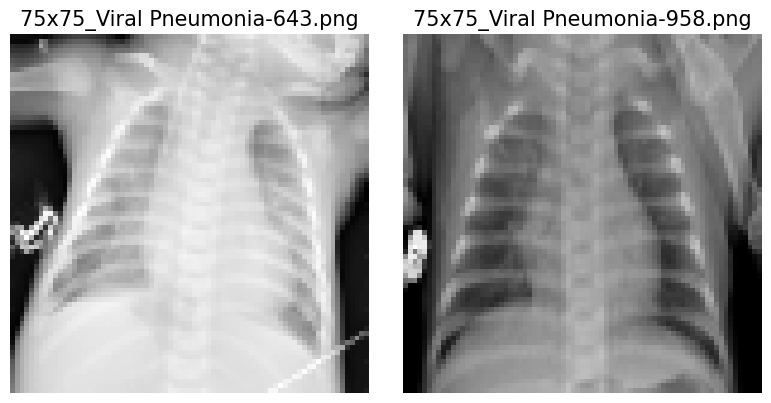

Viral Pneumonia --> Predicted orientation: rotated_minus_90


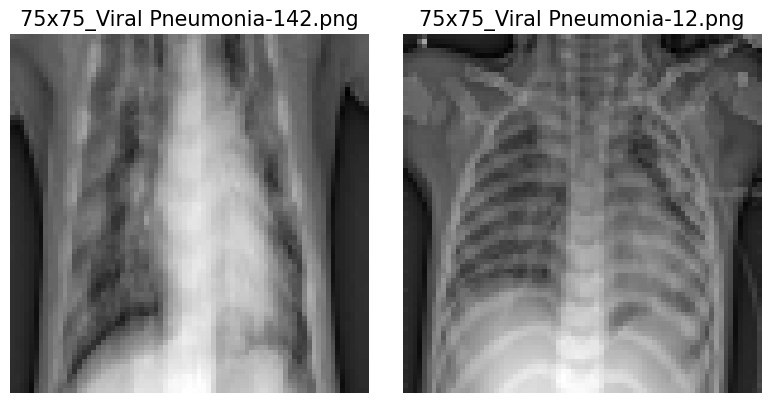

Viral Pneumonia --> Predicted orientation: rotated_180


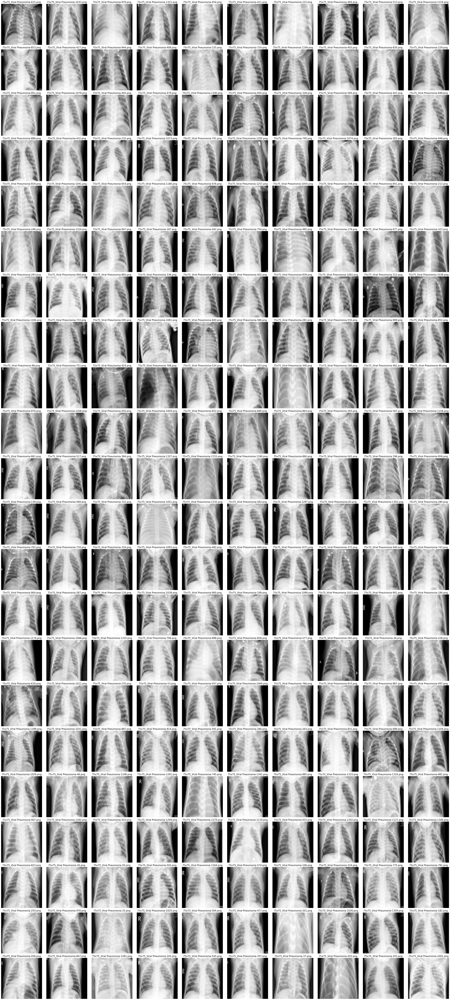

COVID --> Predicted orientation: rotated_90


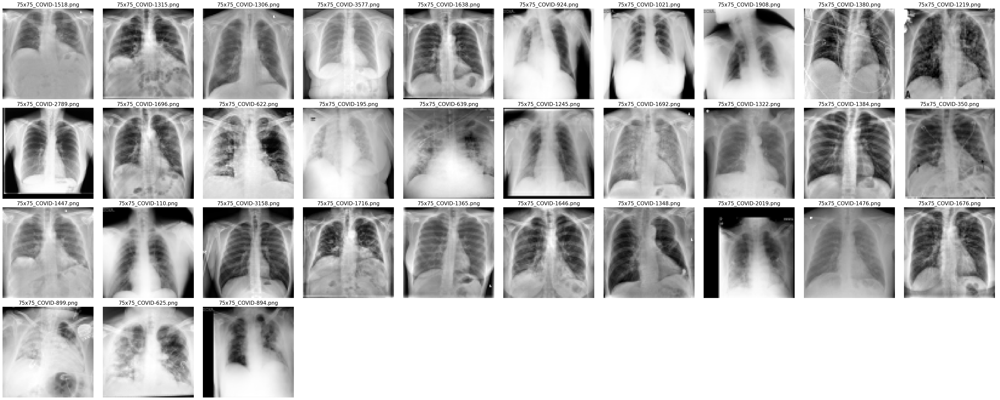

COVID --> Predicted orientation: rotated_minus_90


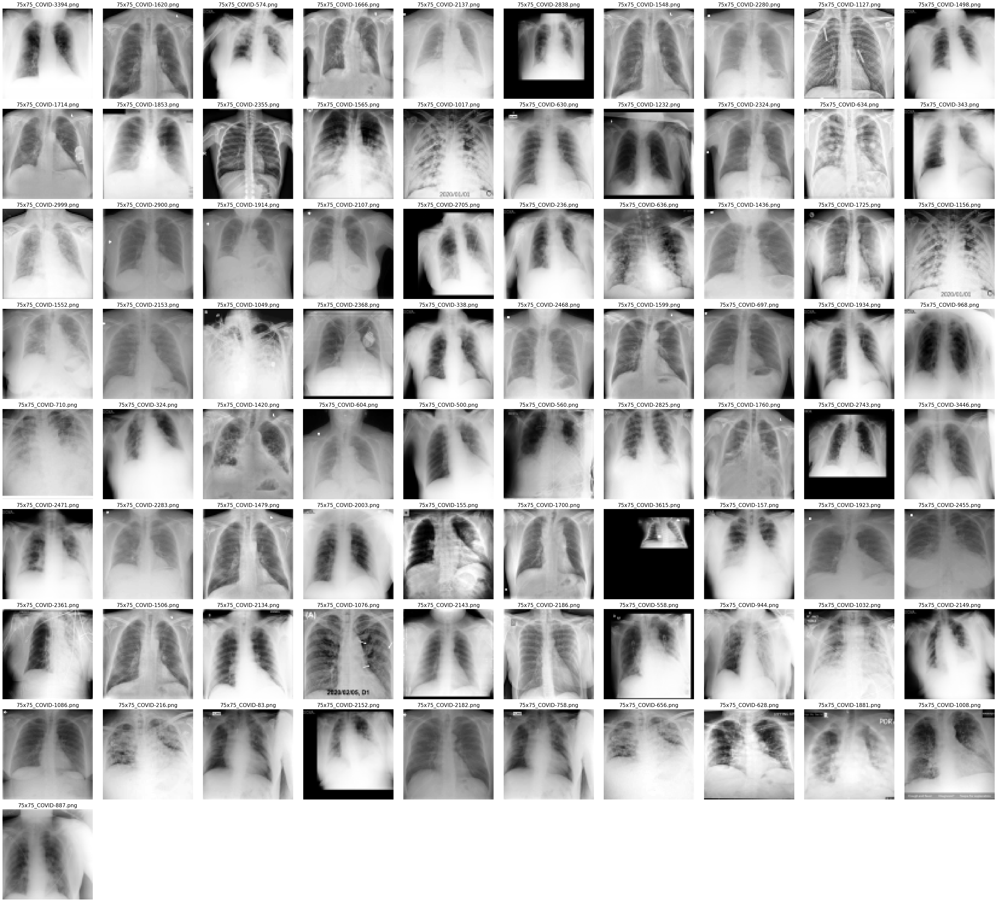

COVID --> Predicted orientation: rotated_180


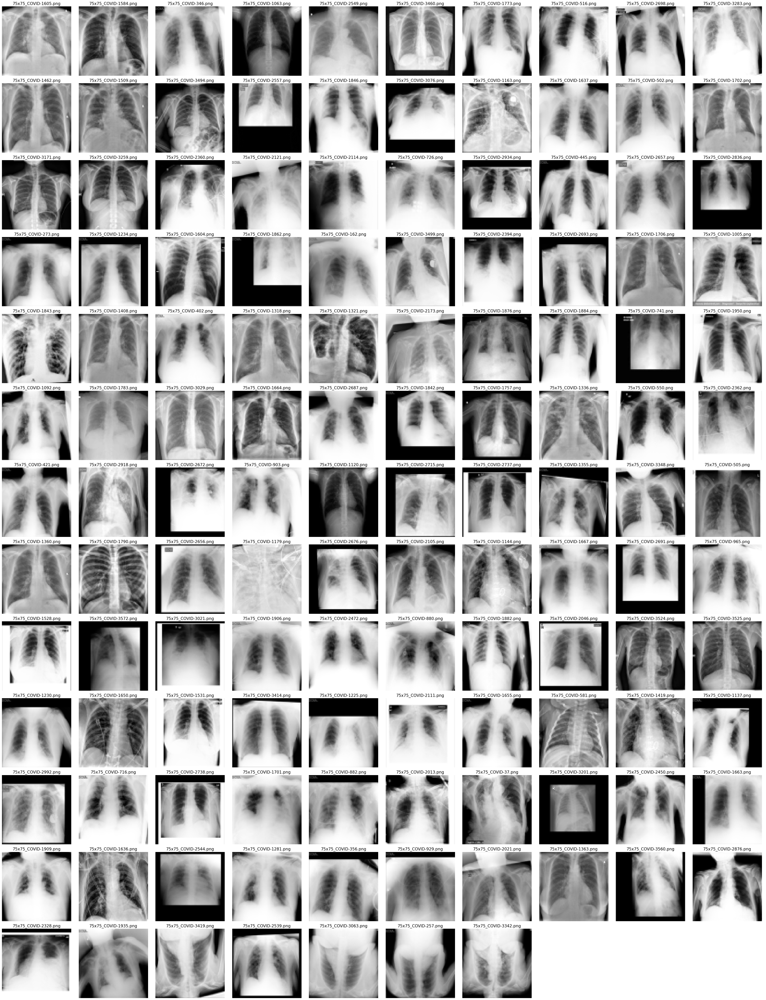

Lung_Opacity --> Predicted orientation: rotated_90


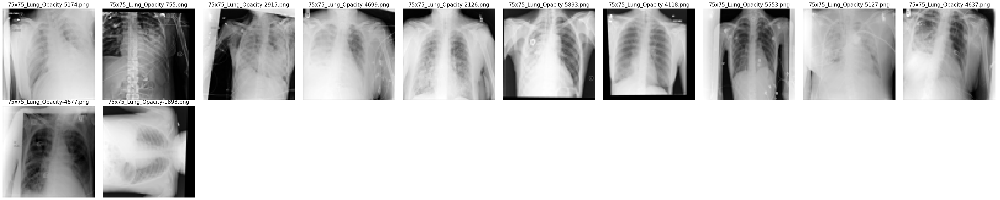

Lung_Opacity --> Predicted orientation: rotated_minus_90


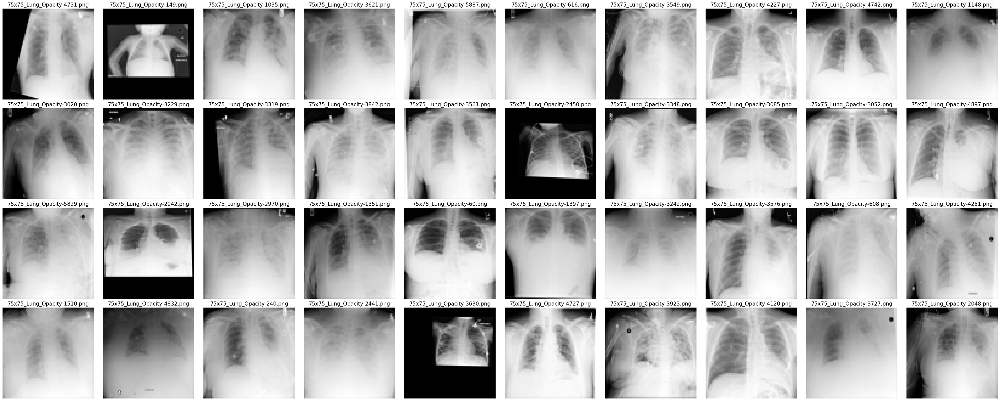

Lung_Opacity --> Predicted orientation: rotated_180


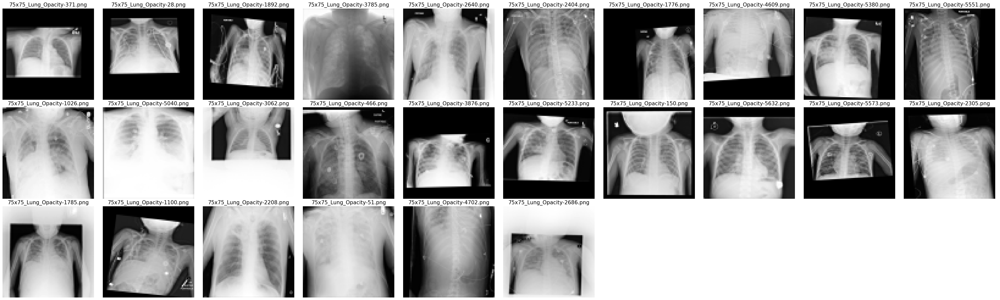

Normal --> Predicted orientation: rotated_90


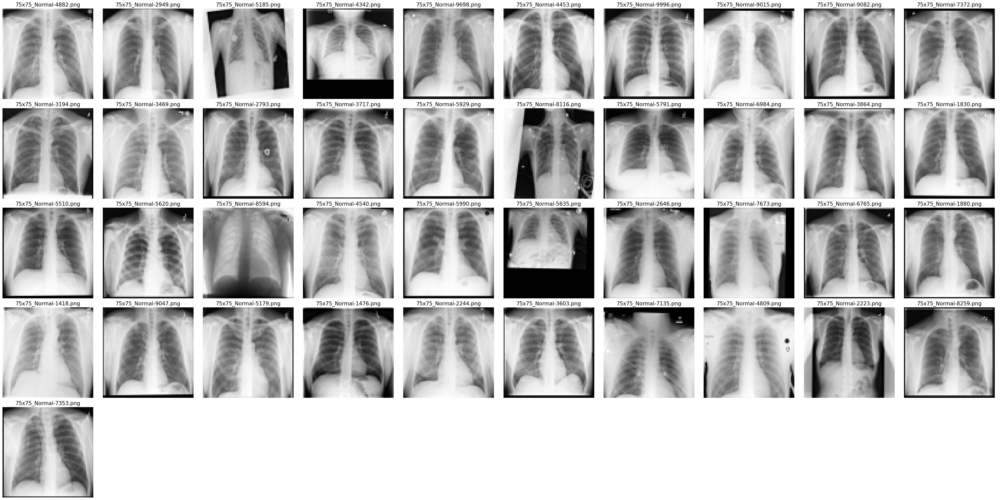

Normal --> Predicted orientation: rotated_minus_90


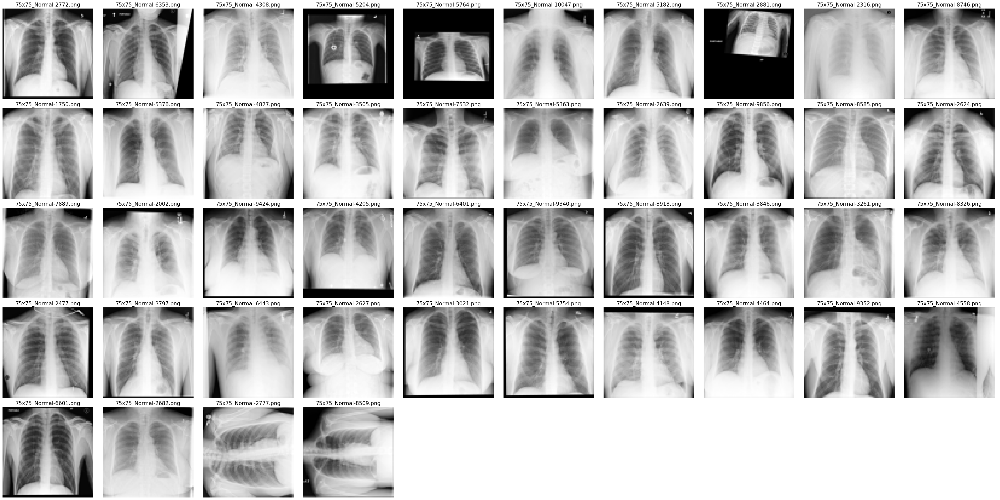

Normal --> Predicted orientation: rotated_180


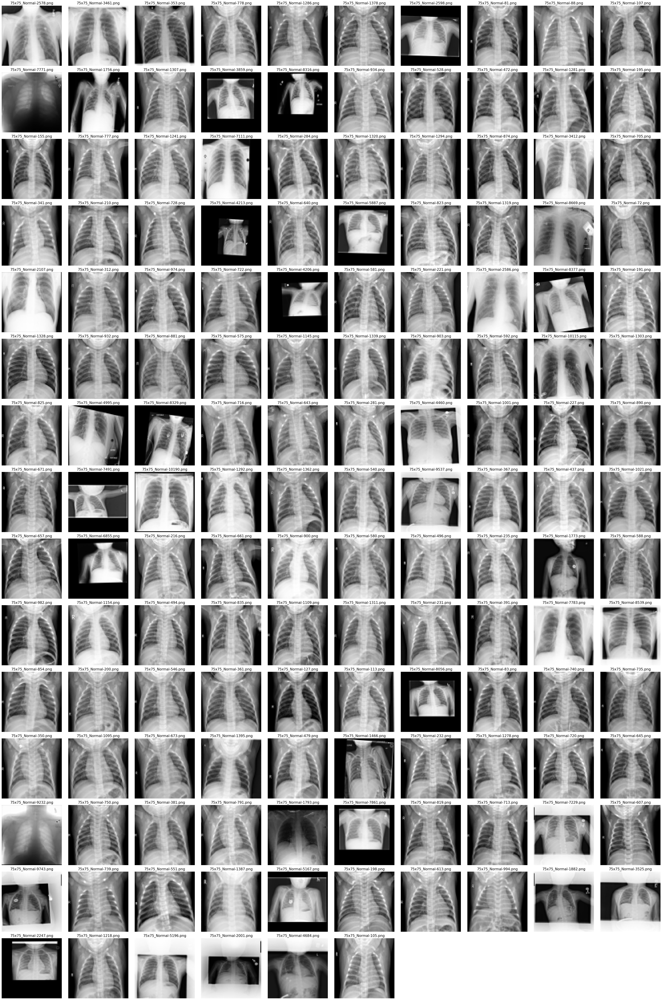

In [15]:
from src.defs import DiseaseCategory
from src.utils.img_processing import ImageProcessor

ip = ImageProcessor()

# load predicted data
selected_dataGenParams = "dataGen_2"
model_dir = fr"C:\Users\User\DataScience\area51\models\resnet\resnet_1\{selected_dataGenParams}"

df_predicted = getPredictedData(model_dir, selected_dataGenParams, sort_by=["Disesase","Orientation","Confidence"])


#rotated image preview
for cat in DiseaseCategory:
    for rot in ("rotated_90", "rotated_minus_90", "rotated_180"):
        img_dir = rf"C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\{cat.value}\downscaled\75x75"
        i_names = df_predicted["Image"][(df_predicted["Disesase"]==cat.value) & (df_predicted["Orientation"] == rot) ].to_list()
        imgs, img_names = ip.loadImgs(i_names, img_dir)
        print(cat.value, "-->",f"Predicted orientation: {rot}")
        ip.plot_images(imgs, img_names, tSize=15, max_img_per_row=10)   
    

In [22]:
df_predicted


,Image,Orientation,Confidence,Disesase
0,COVID-1.png,correct,0.998717,COVID
1,COVID-10.png,correct,0.999598,COVID
2,COVID-100.png,correct,0.955417,COVID
3,COVID-1000.png,correct,0.990501,COVID
4,COVID-1001.png,correct,0.995372,COVID
...,...,...,...,...
21101,Viral Pneumonia-995.png,correct,0.845264,Viral Pneumonia
21102,Viral Pneumonia-996.png,correct,0.999039,Viral Pneumonia
21103,Viral Pneumonia-997.png,correct,0.997386,Viral Pneumonia
21104,Viral Pneumonia-998.png,correct,0.772861,Viral Pneumonia


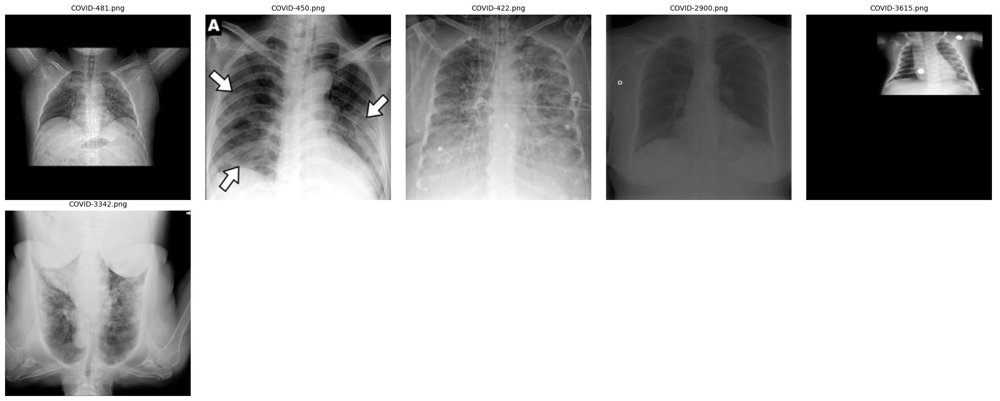

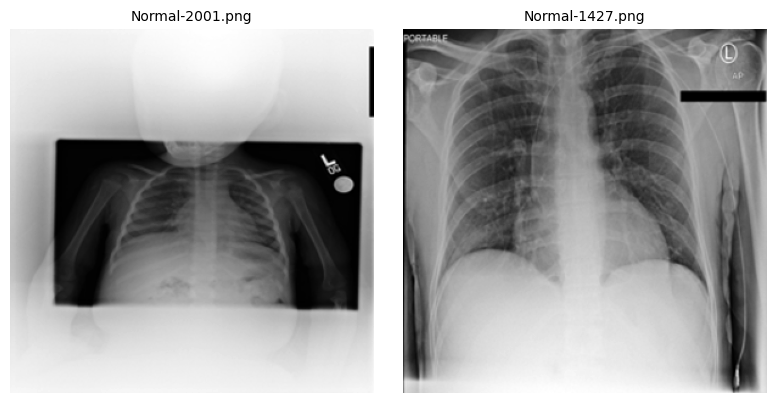

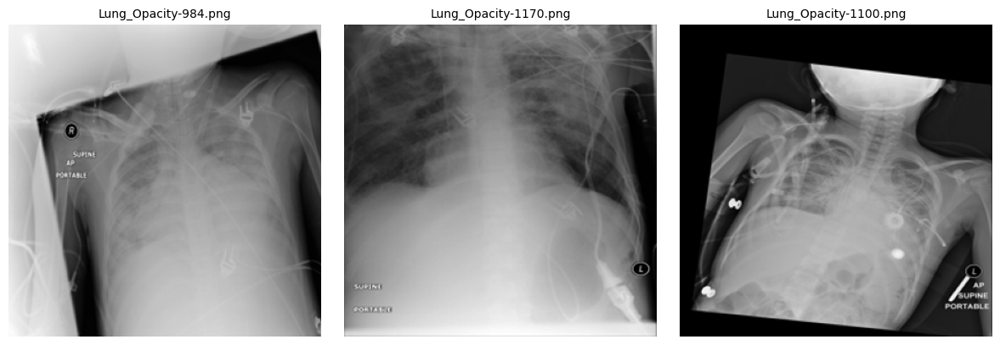

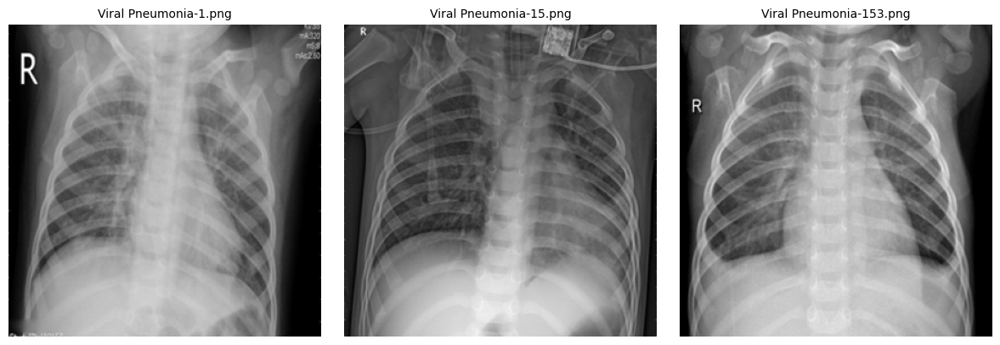

In [ ]:
from src.utils.img_processing import ImageProcessor
from src.defs import DiseaseCategory as dc

# define the set of images having different imaging defects and features to validate 
imgAbn = {
    dc.COVID: [
        "COVID-481.png", 
        "COVID-450.png", 
        "COVID-422.png", 
        "COVID-2900.png", 
        "COVID-3615.png", 
        "COVID-3342.png",  # COVID-3342 flipped by 180°
    ],
    dc.NORMAL: [
        "Normal-2001.png", 
        "Normal-1427.png"
    ],
    dc.LUNG_OPACITY: [
        "Lung_Opacity-984.png", 
        "Lung_Opacity-1170.png", 
        "Lung_Opacity-1100.png"
    ],
    dc.VIRAL_PNEUMONIA: [
        "Viral Pneumonia-1.png", 
        "Viral Pneumonia-15.png", 
        "Viral Pneumonia-153.png"  # good quality
    ]
}


ip=ImageProcessor()

cov, covNames = ip.loadImgs(imgAbn[dc.COVID])
norm, nNames = ip.loadImgs(imgAbn[dc.NORMAL])
opa, opaNames = ip.loadImgs(imgAbn[dc.LUNG_OPACITY])
vir, virNames = ip.loadImgs(imgAbn[dc.VIRAL_PNEUMONIA])

#image preview
ip.plot_images(cov, covNames)
ip.plot_images(norm, nNames )
ip.plot_images(opa, opaNames)
ip.plot_images(vir, virNames )


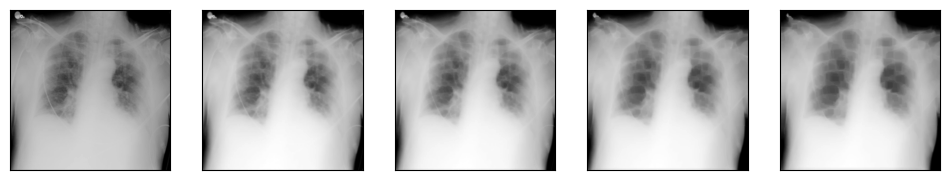

In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# filtered
f_cov77 = r"D:\DataScience\area51\data\COVID-19_Radiography_Dataset\COVID\filtered\CLAHE\images\clahe_COVID-77.png"
# 
cov1 = r"D:\DataScience\area51\data\COVID-19_Radiography_Dataset\COVID\images\COVID-1.png"
cov77 = r"D:\DataScience\area51\data\COVID-19_Radiography_Dataset\COVID\images\COVID-77.png"

# Apply Histogram Equalization
img_f_c77 = cv2.imread(f_cov77, cv2.IMREAD_GRAYSCALE)
img_eq_f_c77 = cv2.equalizeHist(img_f_c77)

img_cov77 = cv2.imread(cov77, cv2.IMREAD_GRAYSCALE)
img_cov1 = cv2.imread(cov1, cv2.IMREAD_GRAYSCALE)
#img_eq_f_c77 = cv2.equalizeHist(img_f_c77)

img = img_cov1

#----erode---
filter_gb = cv2.GaussianBlur(img, ksize = (3,3), sigmaX = 0)
fig = plt.figure(figsize = (12,12))

fig.add_subplot(1,5,1)

plt.imshow(img, cmap = 'gray')
plt.xticks([])
plt.yticks([])

fig.add_subplot(1,5,2)

kernel_0 = np.ones((2,2),np.uint8)
erosion_0 = cv2.erode(filter_gb, kernel_0)

plt.imshow(erosion_0, cmap = 'gray')
plt.xticks([])
plt.yticks([])

fig.add_subplot(1,5,3)

kernel_1 = np.ones((3,3),np.uint8) #best
erosion_1 = cv2.erode(filter_gb, kernel_1)

plt.imshow(erosion_1, cmap = 'gray')
plt.xticks([])
plt.yticks([])

fig.add_subplot(1,5,4)

kernel_2 = np.ones((5,5),np.uint8)
erosion_2 = cv2.erode(filter_gb, kernel_2)

plt.imshow(erosion_2, cmap = 'gray')
plt.xticks([])
plt.yticks([])

fig.add_subplot(1,5,5)

kernel_3 = np.ones((7,7),np.uint8)
erosion_3 = cv2.erode(filter_gb, kernel_3)

plt.imshow(erosion_3, cmap = 'gray')
plt.xticks([])
plt.yticks([])

plt.show();

Detected rotation angle: 27.56 degrees


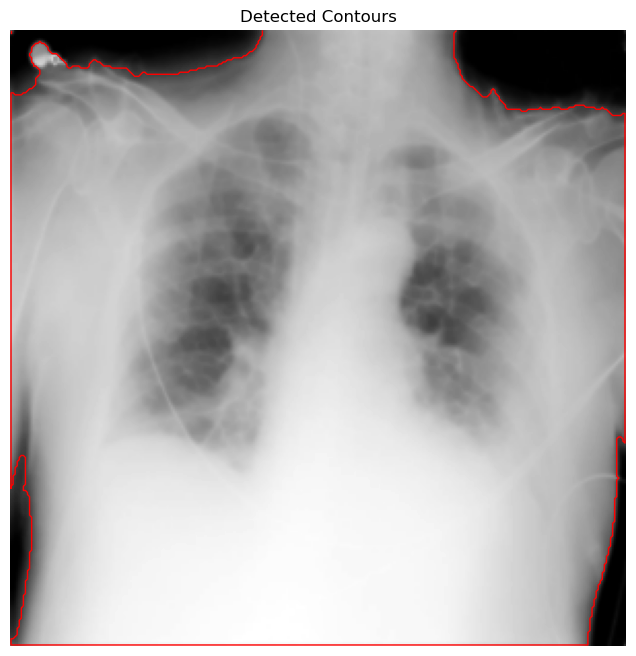

Detected rotation angle: 32.10 degrees


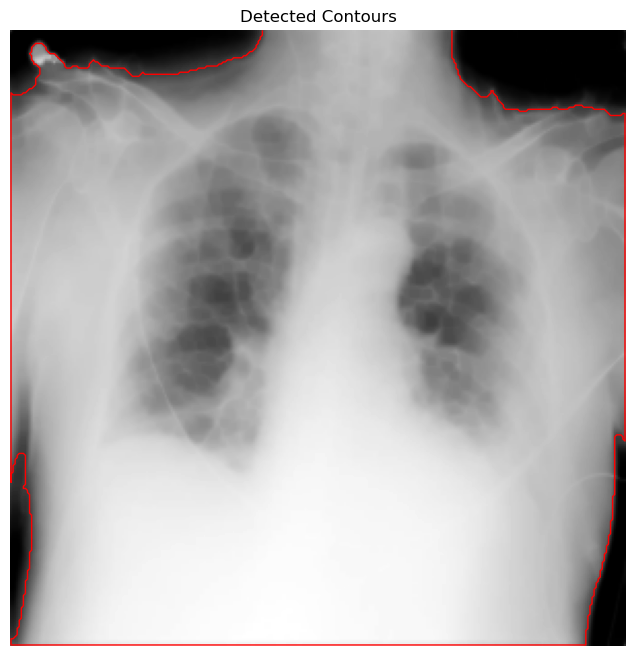

Detected rotation angle: 38.08 degrees


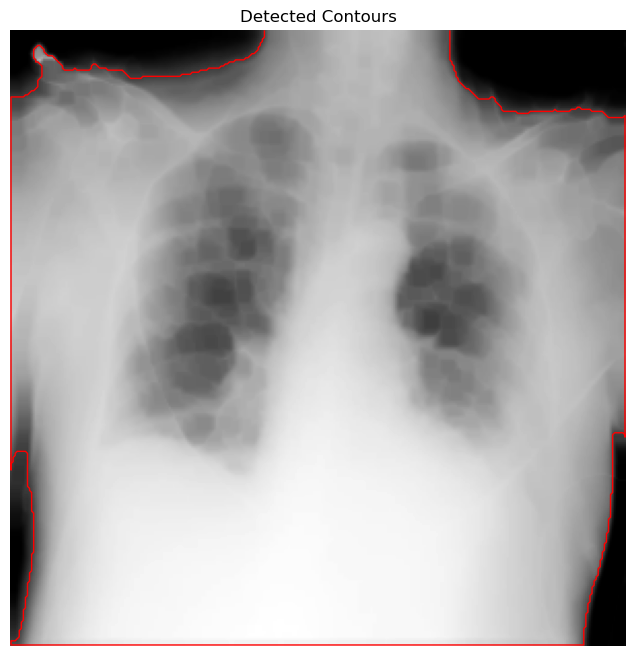

Detected rotation angle: -42.29 degrees


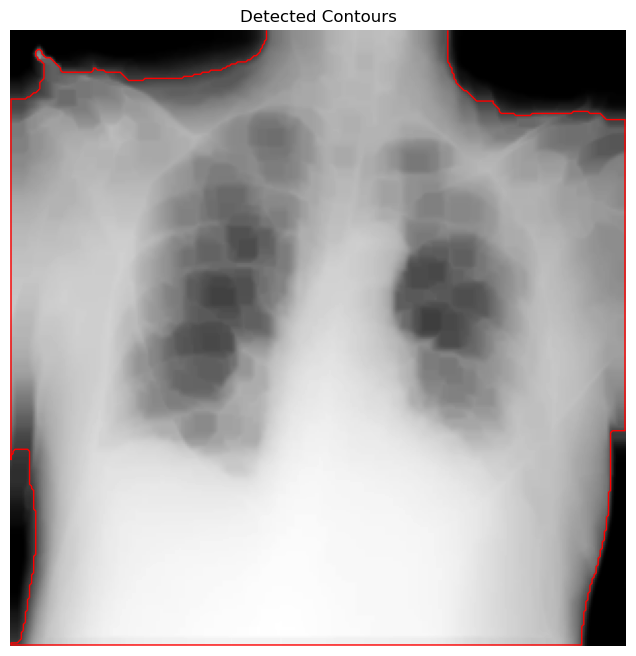

(np.float32(27.555851),
 np.float32(32.102562),
 np.float32(38.076843),
 np.float32(-42.28801))

In [35]:

def detect_rotation_pca(image):
        
    # Apply threshold to extract foreground (lungs, bones, etc.)
    _, binary = cv2.threshold(image, 50, 255, cv2.THRESH_BINARY)
    
    # Find contours of the thresholded image
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Merge all contours into a single dataset of points
    all_points = np.vstack([c.reshape(-1, 2) for c in contours])
    
    # Apply PCA to find the main orientation
    mean, eigenvectors = cv2.PCACompute(all_points.astype(np.float32), mean=None)
    principal_axis = eigenvectors[0]  # First eigenvector represents main orientation
    
    # Compute the angle of rotation
    angle = np.arctan2(principal_axis[1], principal_axis[0]) * 180 / np.pi
    
    # Normalize the angle to be within [-90, 90] degrees
    if angle < -45:
        angle += 90
    elif angle > 45:
        angle -= 90
    
    print(f"Detected rotation angle: {angle:.2f} degrees")
    
    # Plot contours and overlay on image
    plt.figure(figsize=(8, 8))
    plt.imshow(image, cmap='gray')
    for contour in contours:
        plt.plot(contour[:, 0, 0], contour[:, 0, 1], 'r', linewidth=1)
    plt.title("Detected Contours")
    plt.axis('off')
    plt.show()
    
    return angle

blurred = cv2.GaussianBlur(img_cov77, (9,9), 10)
sharp_image = cv2.addWeighted(img_cov77, 1.5, blurred, -0.5, 0)


detect_rotation_pca(erosion_0), detect_rotation_pca(erosion_1), detect_rotation_pca(erosion_2),  detect_rotation_pca(erosion_3) #13.96/17.18/19.13 with img_eq_f_c77
#detect_rotation_pca(img_cov77), detect_rotation_pca(img_eq_f_c77),  detect_rotation_pca(sharp_image) #30.87/17.16/17.61

# Supervised lung area segmentation using U-Net and TensorFlow

Difference Between Supervised and Unsupervised Methods in Lung Segmentation
1. Supervised Methods

Supervised methods rely on labeled data, where each chest X-ray image has corresponding ground truth segmentation masks (i.e., manually or semi-automatically labeled lung regions). These methods typically use deep learning architectures such as U-Net, Mask R-CNN, or Fully Convolutional Networks (FCNs) trained to predict the lung boundaries based on these labeled examples.

✅ Pros:

    High accuracy when a large labeled dataset is available.
    Well-established and widely used in medical imaging.
    Generalizes well to similar images.

❌ Cons:

    Requires a lot of annotated data, which is costly and time-consuming.
    Performance may drop on images with unseen variations (e.g., different diseases, imaging conditions).

2. Unsupervised Methods

Unsupervised methods do not rely on labeled segmentation masks. Instead, they use techniques such as clustering, thresholding, edge detection, and generative models to segment the lung area based on patterns within the images themselves.

🛠 Common unsupervised techniques:

    Thresholding (e.g., Otsu’s method): Identifies lung regions based on pixel intensity differences.
    Clustering (e.g., K-means, Gaussian Mixture Models): Groups pixels based on similarity.
    Active Contours (e.g., Level Set Method): Evolves a contour to detect lung boundaries.
    Autoencoders / GANs (Generative Adversarial Networks): Learns features without explicit labels.

✅ Pros:

    Does not require manually labeled data.
    Can generalize to unseen images more flexibly.
    Useful in scenarios where labeled data is limited or unavailable.

❌ Cons:

    Usually less accurate than supervised methods.
    May struggle in complex cases (e.g., when lungs have abnormalities like tumors or severe infections).
    Requires fine-tuning and post-processing for better segmentation.

Key Differences:
Feature	Supervised	Unsupervised
Labeled Data	Required	Not required
Accuracy	Generally higher	Lower, depends on method
Flexibility	Limited to training data	More adaptable
Computational Complexity	Higher (Deep Learning)	Lower (Clustering, Thresholding)
Example Models	U-Net, Mask R-CNN	K-Means, Active Contours

📌 Summary:

    If you have labeled lung masks, supervised deep learning (e.g., U-Net) is the best choice.
    If you don’t have labels, unsupervised methods like thresholding, clustering, or autoencoders can help, but they may need post-processing for better results.

Creating contours of the lung area in chest X-ray images, commonly known as lung segmentation, is a crucial step in medical image analysis. This process involves delineating the lung boundaries to assist in diagnosing various pulmonary conditions. Below are some YouTube tutorials that provide step-by-step guidance on performing lung segmentation using different techniques and tools:

    Lung Segmentation Using U-Net and TensorFlow: This tutorial demonstrates how to implement and train a U-Net model for lung segmentation using TensorFlow and Keras. It covers data preparation, model architecture, and training processes.

NameError: name 'ipython' is not defined